<a href="https://colab.research.google.com/github/garrettdevereux/DeepLearningGenerativeArt/blob/main/Diff_Aug_MonetGANV2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# University of Washington CSE 493G1 Final Project: MonetGAN - Generative Art
## Garrett Devereux, Deekshita S Doli, and Begoña García Malaxechebarría

This notebook serves as one of our advanced implementations for our Generative Art project utilizing the [Kaggle I'm Something of a Painter Myself](https://www.kaggle.com/competitions/gan-getting-started/data) dataset. Here, we implement Differentiable Augmentation for a Dual Discriminator and compare it to the performance of our [Baseline DC CycleGAN](https://github.com/garrettdevereux/DeepLearningGenerativeArt/blob/main/MonetGANV1.ipynb).


This notebook is heavily inspired from a variety of different references:

*   The Kaggle suggested [CycleGAN Tutorial Notebook](https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook)
*   [PyTorch Lightning Notebook](https://www.kaggle.com/code/chongzhenjie/photo-to-monet-cyclegan-pytorch-lightning/notebook) that introduces the implementation and benefits of training with PyTorch Lightning. 
* [Two-objective Discriminator Notebook](https://www.kaggle.com/code/unfriendlyai/two-objective-discriminator)
* [Original CycleGAN paper](https://arxiv.org/abs/1703.10593)
* [Original UNet Generator paper](https://paperswithcode.com/paper/u-net-convolutional-networks-for-biomedical)
* [Original PatchGAN Discriminator paper](https://paperswithcode.com/method/patchgan)
* [Original Differential Augmentation paper](https://arxiv.org/abs/2006.10738)
* [Original Dual Discriminator paper](https://arxiv.org/abs/1709.03831)


## Import Necessary Libraries

Ensure PyTorch Lightning is installed along with all necessary libraries

In [ ]:
!pip install pytorch_lightning;
!pip install deepspeed

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.0/719.0 kB 39.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 36.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 35.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 19.3 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.3/779.3 kB 15.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 kB 20.0 MB/s eta 0:00:00
  Created wheel for deepspeed: file

In [ ]:
import glob
import os
import shutil

import deepspeed as ds
import torchvision.models as models
import matplotlib.pyplot as plt
import numpy as np
import pytorch_lightning as L
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision.io import read_image
from torchvision.utils import make_grid, save_image


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


## Download Dataset and Connect Drive

Connect to Google Drive to load dataset. Note that the dataset being used is available [here](https://www.kaggle.com/competitions/gan-getting-started/data). This project was built inside a Google Drive folder named ```Code``` with the datset located in the subdirectory ```Code/Dataset/gan-getting-started```. Make sure you modify the paths to reflect the correct file structure.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Store the current directory as ```Code``` so we can refer to future files as if we are already in the directory. Update checkpoints to the directory where we will store and save all of the trained models.

In [ ]:
os.chdir("/content/drive/MyDrive/Code")
checkpoints = "/content/drive/MyDrive/Code/checkpoints/MonetGANV2"

If correctly mounted, should see 'MonetGANV1.ipynb', 'Dataset' and others in the current directory and 'monet_jpg' and 'photo_jpg' inside of ```Dataset/gan-getting-started/```

In [ ]:
print("Current Directory:")
!ls;
print()
print("Dataset Contents:")
!ls Dataset/gan-getting-started

Current Directory:
 Bego_PyTorch_MonetGAN.ipynb		  Diff_Aug_MonetGANV2.ipynb
 checkpoints				  Graphs
'Copy of monet-cyclegan-tutorial.ipynb'   MonetGAN_Pretrained.ipynb
 Dataset				  MonetGAN_StyleGAN.ipynb
 dee_MonetGANV1_copy.ipynb		  MonetGANV1.ipynb
 diagrams				  submissions

Dataset Contents:
Bego_monet_jpg	Bego_photo_jpg	monet_jpg  photo_jpg


## Load and Preprocess the Data

As this is the baseline example, we won't worry about Data Augmentation or any advanced preprocessing techniques. Instead we will just focus on setting up the Dataset and Dataloaders as seen in [PyTorch Tutorial from Recitation](https://courses.cs.washington.edu/courses/cse493g1/23sp/schedule/lectures/recitation4.pdf) and try to Visualize the Dataset 

### Storing The Dataset

In order to load and store the Dataset, we need to define a ```CustomImageDataset``` class that implements three functions:


*   **```__init__```**: store any internal values that may be of use
*   **```__len__```**: get the size of the dataset
*   **```__getitem__```**: get the i'th image in the dataset

Different instances of this class will be used to store the Photos and the Monet Paintings separately





In [ ]:
class CustomImageDataset(Dataset):
    def __init__(self, filenames, stage):
        # A list of every filename of every image in the dataset
        self.filenames = filenames
        # Stage of the current dataset (fit, test, predict)
        # Helps determine correct behavior when using the Dataset
        self.stage = stage
        
    def __len__(self):
        # Return the length of the list
        return len(self.filenames)
    
    def __getitem__(self, idx):
        # Get the corresponding image and scale it
        img_name = self.filenames[idx]
        img = read_image(img_name) / 255.0
        return img * 2 - 1

### DataLoaders and DataModules

Next, we prepare the Dataset by separately loading the Monet Paintings and Photos into their own DataLoaders. As we are going to use PyTorch Lightning for the training process, we will handle all of this in a single Custom ```LightningDataModule```. This allows us to greatly simplify the configuration while encapsulating the five steps of preprocessing:




1.   Download / tokenize / process.
2.   Clean and (maybe) save to disk.
3.   Load inside ```Dataset```.
4.   Apply transforms (rotate, tokenize, etc…).
5.   Wrap inside a ```DataLoader```.






See the [PyTorch Lightning Documentation](https://lightning.ai/docs/pytorch/stable/data/datamodule.html) for more details.

In [ ]:
class CustomDataModule(L.LightningDataModule):
    def __init__(
        self,
        monet_dir,
        photo_dir, 
        loader_config,
        sample_size,
        batch_size,
    ):
        super().__init__()
        # Store Configuration details to pass to DataLoaders
        self.loader_config = loader_config
        # Batch Size for Val and Test stages (mainly for visualization)
        self.sample_size = sample_size
        # Batch Size for Predict phase
        self.batch_size = batch_size       
            
        # Store Sorted filenames of all the Monet Paintings and Photos in the dataset
        self.monet_filenames = sorted(glob.glob(monet_dir))
        self.photo_filenames = sorted(glob.glob(photo_dir))
        
    # Handle the Creation of Datasets and Train/Test/Val split
    def setup(self, stage):
        if stage == "fit":
            self.train_monet = CustomImageDataset(self.monet_filenames, stage)
            self.train_photo = CustomImageDataset(self.photo_filenames, stage)
            
        if stage in ["fit", "test", "predict"]:
            # Validation is the dataset of Photos that will be used
            # to be converted to Monet Paintings
            self.valid_photo = CustomImageDataset(self.photo_filenames, None)

    # After setup is called, train_dataloader will return the Wrapped Loaders
    # Of the Monet Paintings AND Photos for training
    def train_dataloader(self):
        # Create config for loaders with passed in config
        loader_config = {
            "shuffle": True,
            "drop_last": True,
            "batch_size": self.batch_size,
            **self.loader_config,
        }
        # Create Dataloaders for each Dataset and return
        loader_monet = DataLoader(self.train_monet, **loader_config)
        loader_photo = DataLoader(self.train_photo, **loader_config)
        loaders = {"monet": loader_monet, "photo": loader_photo}
        return loaders
    
    # Test and Val Dataloaders are the same
    # Just the Dataset of Photos
    def val_dataloader(self):
        return DataLoader(
            self.valid_photo,
            batch_size=self.sample_size,
            **self.loader_config,
        )
    
    def test_dataloader(self):
        return self.val_dataloader()
    
    # Predict also uses Photos dataset 
    # but uses batch size rather than sample size
    def predict_dataloader(self):
        return DataLoader(
            self.valid_photo,
            batch_size=self.batch_size,
            **self.loader_config,
        )

### Configuration Details

Here we setup the configuration that allows us to create our ```CustomDataModule``` setting key values such as the directories to the datasets, the loader config, and the batch sizes.

In [ ]:
DM_CONFIG = {    
    # Directories of the Monet Paintings and Photos
    "monet_dir": os.path.join("./Dataset/gan-getting-started/monet_jpg", "*.jpg"),
    "photo_dir": os.path.join("./Dataset/gan-getting-started/photo_jpg", "*.jpg"),
    
    "loader_config": {
        # the number of subprocesses (excluding the main process) used for data loading
        "num_workers": os.cpu_count(),
        
        # enable faster data transfer to GPU during training
        "pin_memory": torch.cuda.is_available(),
    },
    
    # the validation/test batch size (mainly for visualization purposes)
    "sample_size": 5,
    
    # the training/prediction batch size
    "batch_size": 1
}

## Understanding the Dataset

Now we instantiate the ```CustomDataModule``` using the above configuration, then call ```train_dataloader()``` to get the Monet and Photos Dataloaders. Looking at the data that is produced, we can see that with a batch size of 1 we have 300 Monet Paintings and 7028 Photos. Additionally, we can see that our images are shape 3 x 256 x 256 where we each photo has 3 channels with height and width of 256

In [ ]:
# Instiantiate the CustomDataModule with the DM Config
dm_understand = CustomDataModule(**{k: v for k, v in DM_CONFIG.items()})
# Call setup with stage fit to setup both the Monet Loader and the Photos Loader
dm_understand.setup("fit")

# Train_loader now returns both the Monet Loader and the Photos Loader
train_loader = dm_understand.train_dataloader()
monet_ds = train_loader["monet"]
photo_ds = train_loader["photo"]

# Lengths of the Dataset
print("Number of Monet Paintings: " + str(len(monet_ds)))
print("Number of Photos: " + str(len(photo_ds)))
print()

# Image size 3 x 256 x 256
print("Image Sizes: ")
print(next(iter(monet_ds))[0].shape)
print(next(iter(photo_ds))[0].shape)
print()

# Store a set of example images to understand and visualize
example_monets = torch.empty((5, 3, 256, 256))
example_photos = torch.empty((5, 3, 256, 256))

# Example of how to keep getting images form each Dataset
# Note Batch Size = 1 so we get a batch of 1 on each next()
for i in range(5):
  example_monets[i] = next(iter(monet_ds))
  example_photos[i] = next(iter(photo_ds))

print("Example Batch Sizes:")
print(example_monets.shape)
print(example_photos.shape)

Number of Monet Paintings: 300
Number of Photos: 7038

Image Sizes: 
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])

Example Batch Sizes:
torch.Size([5, 3, 256, 256])
torch.Size([5, 3, 256, 256])


## Differential Augmentation

From "Differentiable Augmentation for Data-Efficient GAN Training":

The performance of generative adversarial networks (GANs) heavily deteriorates
given a limited amount of training data. This is mainly because the discriminator is memorizing the exact training set. To combat it, we propose Differentiable Augmentation (DiffAugment), a simple method that improves the data efficiency of GANs by imposing various types of differentiable augmentations on both real and fake samples. Previous attempts to directly augment the training data manipulate the distribution of real images, yielding little benefit; DiffAugment enables us to adopt the differentiable augmentation for the generated samples, effectively stabilizes training, and leads to better convergence."

With only 300 samples of Monet Paintings, Differential Augmentation seems to be a perfect fit for our model. The below implementation is inspired from the initial paper, and converts the TensorFlow code to PyTorch

In [ ]:
# Inspired from https://github.com/mit-han-lab/data-efficient-gans/blob/master/DiffAugment-stylegan2/DiffAugment_tf.py

def DiffAugment(x, policy='', channels_first=True):
    if policy:
        if not channels_first:
            x = x.permute(0, 3, 1, 2)
        for p in policy.split(','):
            for f in AUGMENT_FNS[p]:
                x = f(x)
        if not channels_first:
            x = x.permute(0, 2, 3, 1)
        x = x.contiguous()
    return x


def rand_brightness(x):
    x = x + (torch.rand(x.size(0), 1, 1, 1, dtype=x.dtype, device=x.device) - 0.5)
    return x


def rand_saturation(x):
    x_mean = x.mean(dim=1, keepdim=True)
    x = (x - x_mean) * (torch.rand(x.size(0), 1, 1, 1, dtype=x.dtype, device=x.device) * 2) + x_mean
    return x


def rand_contrast(x):
    x_mean = x.mean(dim=[1, 2, 3], keepdim=True)
    x = (x - x_mean) * (torch.rand(x.size(0), 1, 1, 1, dtype=x.dtype, device=x.device) + 0.5) + x_mean
    return x


def rand_translation(x, ratio=0.125):
    shift_x, shift_y = int(x.size(2) * ratio + 0.5), int(x.size(3) * ratio + 0.5)
    translation_x = torch.randint(-shift_x, shift_x + 1, size=[x.size(0), 1, 1], device=x.device)
    translation_y = torch.randint(-shift_y, shift_y + 1, size=[x.size(0), 1, 1], device=x.device)
    grid_batch, grid_x, grid_y = torch.meshgrid(
        torch.arange(x.size(0), dtype=torch.long, device=x.device),
        torch.arange(x.size(2), dtype=torch.long, device=x.device),
        torch.arange(x.size(3), dtype=torch.long, device=x.device),
    )
    grid_x = torch.clamp(grid_x + translation_x + 1, 0, x.size(2) + 1)
    grid_y = torch.clamp(grid_y + translation_y + 1, 0, x.size(3) + 1)
    x_pad = F.pad(x, [1, 1, 1, 1, 0, 0, 0, 0])
    x = x_pad.permute(0, 2, 3, 1).contiguous()[grid_batch, grid_x, grid_y].permute(0, 3, 1, 2).contiguous()
    return x


def rand_cutout(x, ratio=0.5):
    cutout_size = int(x.size(2) * ratio + 0.5), int(x.size(3) * ratio + 0.5)
    offset_x = torch.randint(0, x.size(2) + (1 - cutout_size[0] % 2), size=[x.size(0), 1, 1], device=x.device)
    offset_y = torch.randint(0, x.size(3) + (1 - cutout_size[1] % 2), size=[x.size(0), 1, 1], device=x.device)
    grid_batch, grid_x, grid_y = torch.meshgrid(
        torch.arange(x.size(0), dtype=torch.long, device=x.device),
        torch.arange(cutout_size[0], dtype=torch.long, device=x.device),
        torch.arange(cutout_size[1], dtype=torch.long, device=x.device),
    )
    grid_x = torch.clamp(grid_x + offset_x - cutout_size[0] // 2, min=0, max=x.size(2) - 1)
    grid_y = torch.clamp(grid_y + offset_y - cutout_size[1] // 2, min=0, max=x.size(3) - 1)
    mask = torch.ones(x.size(0), x.size(2), x.size(3), dtype=x.dtype, device=x.device)
    mask[grid_batch, grid_x, grid_y] = 0
    x = x * mask.unsqueeze(1)
    return x


AUGMENT_FNS = {
    'color': [rand_brightness, rand_saturation, rand_contrast],
    'translation': [rand_translation],
    'cutout': [rand_cutout],
}

# Should be passing a batch to this function (n, c, h, w)
def aug_fn(image):
    return DiffAugment(image,"color,translation,cutout")

## Visualizing the Dataset

With an understanding of how we can initialize the Dataloaders, iterate through batches, and visualize the shapes of the images and batches, let's now look at what the images actually look like, first with no augmentation:

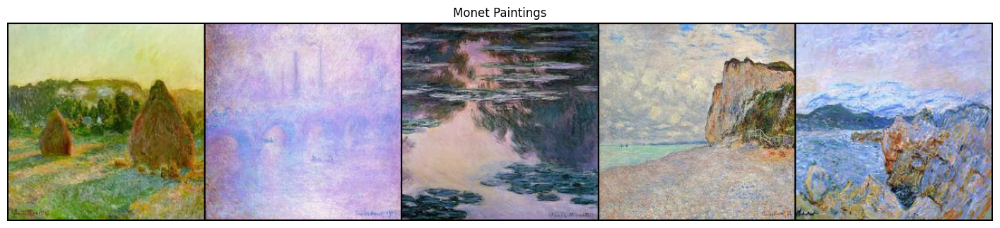

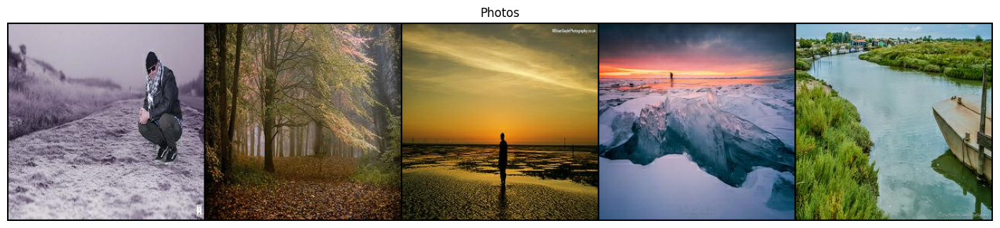

In [ ]:
def show_img(img_tensor, nrow, title=""):
    img_tensor = img_tensor.detach().cpu() * 0.5 + 0.5
    img_grid = make_grid(img_tensor, nrow=nrow).permute(1, 2, 0)
    plt.figure(figsize=(18, 8))
    plt.imshow(img_grid)
    plt.axis("off")
    plt.title(title)
    plt.show()

show_img(example_monets, nrow=5, title="Monet Paintings")
show_img(example_photos, nrow=5, title="Photos")

## Visualize with Differential Augmentation

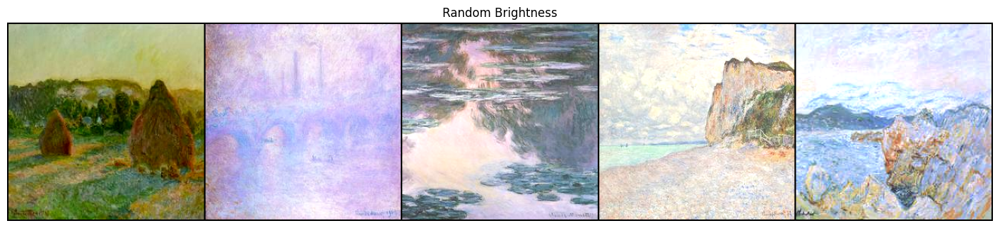

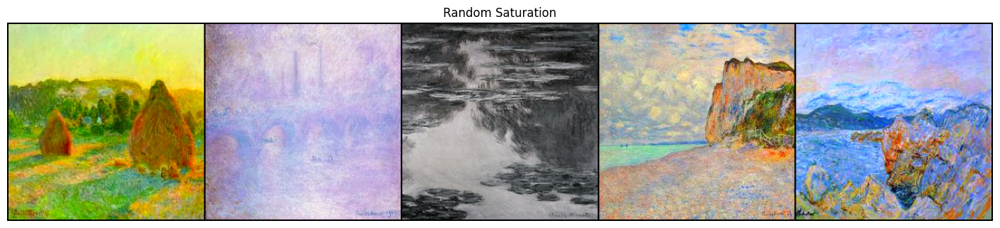

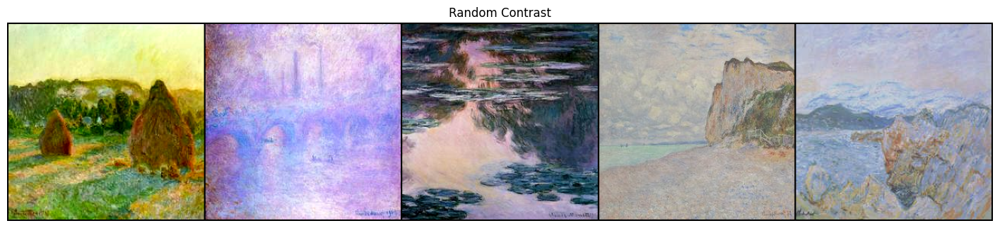

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


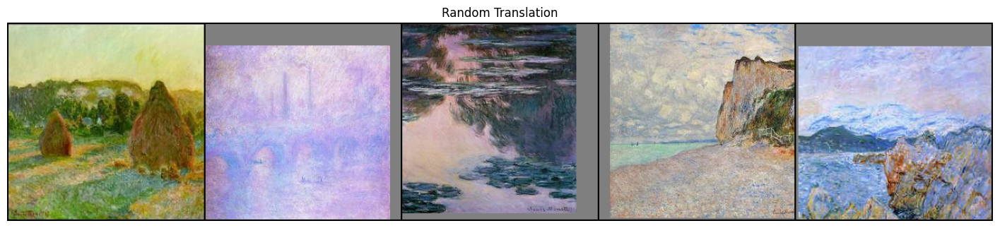

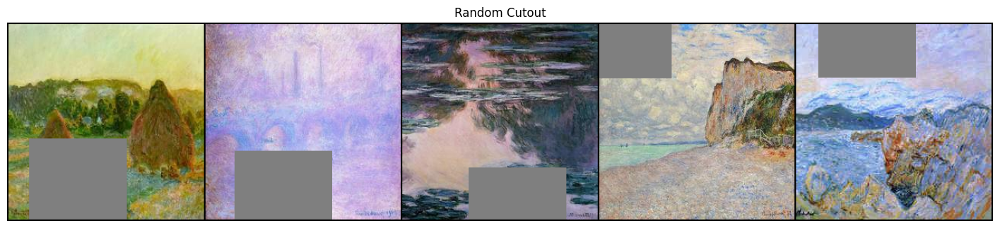

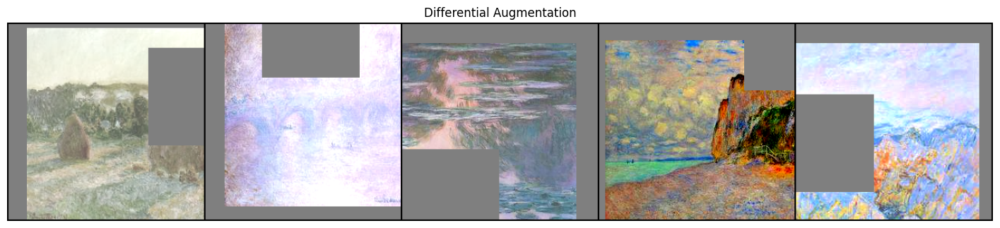

In [ ]:
show_img(rand_brightness(example_monets), nrow=5, title="Random Brightness")
show_img(rand_saturation(example_monets), nrow=5, title="Random Saturation")
show_img(rand_contrast(example_monets), nrow=5, title="Random Contrast")
show_img(rand_translation(example_monets), nrow=5, title="Random Translation")
show_img(rand_cutout(example_monets), nrow=5, title="Random Cutout")
show_img(aug_fn(example_monets), nrow=5, title="Differential Augmentation")

# Generators and Discriminators in GANs

![image.jpg](https://cpang4.github.io/gan/content/gen-dis.jpg)
[Image Source](https://cpang4.github.io/gan/)


[From: A Gentle Introduction to CycleGAN for Image Translation](https://machinelearningmastery.com/what-is-cyclegan/):

The GAN architecture is an approach to training a model for image synthesis that is comprised of two models: a generator model and a discriminator model. The generator takes a point from a latent space as input and generates new plausible images from the domain, and the discriminator takes an image as input and predicts whether it is real (from a dataset) or fake (generated). Both models are trained in a game, such that the generator is updated to better fool the discriminator and the discriminator is updated to better detect generated images.

The CycleGAN is an extension of the GAN architecture that involves the simultaneous training of two generator models and two discriminator models.

One generator takes images from the first domain as input and outputs images for the second domain, and the other generator takes images from the second domain as input and generates images for the first domain. Discriminator models are then used to determine how plausible the generated images are and update the generator models accordingly.


## Generator

From the [Tutorial Notebook](https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook):

"We'll be using a UNET architecture for our generators in our CycleGAN. To build our generator, let's first define our downsample and upsample methods.

The downsample, as the name suggests, reduces the 2D dimensions, the width and height, of the image by the stride. The stride is the length of the step the filter takes. Since the stride is 2, the filter is applied to every other pixel, hence reducing the weight and height by 2.

We'll be using an instance normalization instead of batch normalization."

UNET - Architecture

![image.png](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png)
[Image Source](https://paperswithcode.com/method/u-net)

For simplicity, we will initialize all the weights in the Generator with a Random Normal. More advanced initialization techniques can be looked into later (i.e. Xavier or Kaiming init)

In [ ]:
def init_weights(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.InstanceNorm2d)):
      torch.nn.init.normal_(m.weight, mean=0.0, std=0.02)
      if m.bias is not None:
        nn.init.constant_(m.bias, 0.0)

#### Downsampling Module
By initializing model with in ```in_channels``` and ```out_channels``` then calling ```forward()```, we can take an input of size ```(batch_size, in_channels, H, W)``` and output a size of ```(batch_size, out_channels, H/2, W/2)```.

In [ ]:
class Downsampling(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=4,
        stride=2,
        padding=1,
        norm=True,
        lrelu=True,
    ):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels,
                      kernel_size=kernel_size, stride=stride, padding=padding, bias=not norm),
        )
        if norm:
            self.block.append(nn.InstanceNorm2d(out_channels, affine=True))
        if lrelu is not None:
            self.block.append(nn.LeakyReLU(0.2, True) if lrelu else nn.ReLU(True))

        # Apply Init Weights
        self.block.apply(init_weights)
        
    def forward(self, x):
        return self.block(x)

Quick Sanity Check to Ensure Downsampling is working correctly. Note we can also enable Instance Normalization by adding ```norm=True``` in the initialization of our Downsampling model.

In [ ]:
def test_Downsampling():
  # Test going from 3 in_channels -> 64 hidden_channels -> 128 out channels
  # with batch size of 5 and image size 3 x 256 x 256
  in_channels = 3
  hidden_channels = 64
  out_channels = 128
  batch_size = 5
  H = 256
  W = 256
  # Create Zero Tensor of desired input shape
  x = torch.zeros(((batch_size, in_channels, H, W)))
  print("Initial Size:")
  print(x.shape)
  print()

  # Downsample 1: define beginning in->out channels
  model1 = Downsampling(in_channels, hidden_channels)
  scores = model1(x)
  # You should see size [batch_size, hidden_channels, H/2, W/2]
  # Which = [5, 64, 128, 128] in this case
  print("Downsample 1:")
  print(scores.size())
  print()

  # Downsampling 2, need to redefine input/output size
  model2 = Downsampling(hidden_channels, out_channels)
  scores2 = model2(scores)
  # You should see size [batch_size, out_channels, H/4, W/4]
  # Which = [5, 128, 64, 64] in this case
  print("Downsample 2:")
  print(scores2.size())


test_Downsampling()

Initial Size:
torch.Size([5, 3, 256, 256])

Downsample 1:
torch.Size([5, 64, 128, 128])

Downsample 2:
torch.Size([5, 128, 64, 64])


#### Upsampling Module
By initializing model with in ```in_channels``` and ```out_channels``` then calling ```forward()```, we can take an input of size ```(batch_size, in_channels, H, W)``` and output a size of ```(batch_size, out_channels, H*2, W*2)```

In [ ]:
class Upsampling(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=4,
        stride=2,
        padding=1,
        output_padding=0,
        dropout=False,
    ):
        super().__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels,
                               kernel_size=kernel_size, stride=stride, 
                               padding=padding, output_padding=output_padding, bias=False),
            nn.InstanceNorm2d(out_channels, affine=True),
        )
        if dropout:
            self.block.append(nn.Dropout(0.5))
        self.block.append(nn.ReLU(True))

        # Apply Init Weights
        self.block.apply(init_weights)
        
    def forward(self, x):
        return self.block(x)

Quick Sanity Check to Ensure Upsampling is working correctly. Note we can also enable dropout by adding ```dropout=True``` in the initialization of our Upsampling model.

In [ ]:
def test_Upsampling():
  # Test going from 128 in_channels -> 64 hidden_channels -> 3 out channels
  # with batch size of 5 and input size 128 x 64 x 64
  in_channels = 128
  hidden_channels = 64
  out_channels = 3
  batch_size = 5
  H = 64
  W = 64
  # Create Zero Tensor of desired input shape
  x = torch.zeros(((batch_size, in_channels, H, W)))
  print("Initial Size:")
  print(x.shape)
  print()

  # Upsample 1: define beginning in->out channels
  model1 = Upsampling(in_channels, hidden_channels)
  scores = model1(x)
  # You should see size [batch_size, hidden_channels, H*2, W*2]
  # Which = [5, 64, 128, 128] in this case
  print("Upsample 1:")
  print(scores.size())
  print()

  # Upsampling 2, need to redefine input/output size
  model2 = Upsampling(hidden_channels, out_channels)
  scores2 = model2(scores)
  # You should see size [batch_size, out_channels, H*4, W*4]
  # Which = [5, 3, 256, 256] in this case
  print("Upsample 2:")
  print(scores2.size())


test_Upsampling()

Initial Size:
torch.Size([5, 128, 64, 64])

Upsample 1:
torch.Size([5, 64, 128, 128])

Upsample 2:
torch.Size([5, 3, 256, 256])


### Build the Generator!

The generator first downsamples the input image and then upsample while establishing long skip connections, giving it the U-shaped architecture. Skip connections are a way to help bypass the vanishing gradient problem by concatenating the output of a layer to multiple layers instead of only one. Here we concatenate the output of the downsample layer to the upsample layer in a symmetrical fashion. 

Note that we initialize the UNet Generator weights with Random Normals for simplicity, more advanced init techniques may be looked into layer (i.e. Xavier or Kaiming init...)

In [ ]:
class UNetGenerator(nn.Module):
    def __init__(self, hid_channels, in_channels, out_channels):
        super().__init__()

        # Initialize Series Downsampling blocks mapping from an initial
        # (batch_size, 3, 256, 256) -> (batch_size, 512, 1, 1)
        self.downsampling_path = nn.Sequential(
            # Note all following have batch_size as 0 dimension
            # And are assuming hid=64, in=3, out=3, H=W=256
            # However this function will generalize for other sizes
            # (3, 256, 256) -> (64, 128, 128)
            Downsampling(in_channels, hid_channels, norm=False),
            # (64, 128, 128) -> (128, 64, 64)
            Downsampling(hid_channels, hid_channels*2),
            # (128, 64, 64) -> (256, 32, 32)
            Downsampling(hid_channels*2, hid_channels*4),
            # (256, 32, 32) -> (512, 16, 16)
            Downsampling(hid_channels*4, hid_channels*8),
            # (512, 16, 16) -> (512, 8, 8)
            Downsampling(hid_channels*8, hid_channels*8),
            # (512, 8, 8) -> (512, 4, 4)
            Downsampling(hid_channels*8, hid_channels*8),
            # (512, 4, 4) -> (512, 2, 2)
            Downsampling(hid_channels*8, hid_channels*8),
            # (512, 2, 2) -> (512, 1, 1) (turn off instance norm for size 1)
            Downsampling(hid_channels*8, hid_channels*8, norm=False),
        )

        # Intialize Series of Upsamping blocks mapping from
        # (batch_size, 512, 1, 1) -> (batch_size, 128, 128, 128)
        self.upsampling_path = nn.Sequential(
            # Note all following have batch_size as 0 dimension
            # And are assuming hid=64, with initial input (512, 1, 1)
            # However this function will generalize for other sizes
            # (512, 1, 1) -> (512, 2, 2)
            Upsampling(hid_channels*8, hid_channels*8, dropout=True),
            # Concat with Down => (1024, 2, 2) -> (512, 4, 4)
            Upsampling(hid_channels*16, hid_channels*8, dropout=True),
            # Concat with Down => (1024, 4, 4) -> (512, 8, 8)
            Upsampling(hid_channels*16, hid_channels*8, dropout=True),
            # Concat with Down => (1024, 8, 8) -> (512, 16, 16)
            Upsampling(hid_channels*16, hid_channels*8),
            # Concat with Down => (1024, 16, 16) -> (256, 32, 32)
            Upsampling(hid_channels*16, hid_channels*4), # (256+256)x32x32
            # Concat with Down => (512, 32, 32) -> (128, 64, 64)
            Upsampling(hid_channels*8, hid_channels*2),
            # Concat with Down => (256, 64, 64) -> (64, 128, 128)
            Upsampling(hid_channels*4, hid_channels),
            # Concat with Down for final shape (128, 128, 128)
        )

        # Final Feature Block with nonlinearity to map back to image shape
        # Input Size (batch_size, 128, 128, 128) -> (batch_size, 3, 256, 256)
        self.feature_block = nn.Sequential(
            nn.ConvTranspose2d(hid_channels*2, out_channels,
                               kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

        # Apply Init Weights
        # Note Downsampling and Upsampling already applied
        self.feature_block.apply(init_weights)

       
    # Establish Skip Connections in a symmetrical fashion
    def forward(self, x):

        # Begin by applying all downsamples while storing the order
        skips = []
        for down in self.downsampling_path:
            x = down(x)
            skips.append(x)
        skips = reversed(skips[:-1])

        # Next apply all upsamples then concat result with
        # Corresponding downsample result before again upsampling and repeat
        for up, skip in zip(self.upsampling_path, skips):
            x = up(x)
            x = torch.cat([x, skip], dim=1)

        return self.feature_block(x)

Quick Sanity Check to Ensure the UNet architecture operates on our image size correctly, generating a new image of the same size

In [ ]:
def test_UNet():
  # Test with input image of size 3 x 256 x 256 with batch_size = 5
  in_channels = 3
  hidden_channels = 64
  out_channels = 3
  batch_size = 5
  H = 256
  W = 256
  # Create Zero Tensor of batch x image size
  image = torch.zeros(((batch_size, in_channels, H, W)))
  print("Initial Size:")
  print(image.shape)
  print()

  # Apply UNet Generator!
  model = UNetGenerator(hidden_channels, in_channels, out_channels)
  generated_image = model(image)
  # You should see that UNet ends with the same size image generated
  # In this Case [batch_size, out_channels, H, W]
  print("UNet Generation Size:")
  print(generated_image.size())

test_UNet()

Initial Size:
torch.Size([5, 3, 256, 256])

UNet Generation Size:
torch.Size([5, 3, 256, 256])


# Discriminator

The discriminator takes in the input image and classifies it as real or fake (generated). However, instead of conventially outputing a single probability of the input image being real or fake, our GAN used the [PatchGAN discriminator](https://paperswithcode.com/method/patchgan). "PatchGAN is a type of discriminator which only penalizes structure at the scale of local image patches. The PatchGAN discriminator tries to classify if each patch in an image is real or fake. This discriminator is run convolutionally across the image, averaging all responses to provide the ultimate output decision." 

This implementation will allow more descriptive losses that will help us improve our generators faster than a single Real or Fake prediction might.

![image2.jpg](https://www.researchgate.net/profile/Gozde-Unal-2/publication/323904616/figure/fig1/AS:606457334595585@1521602104652/PatchGAN-discriminator-Each-value-of-the-output-matrix-represents-the-probability-of_W640.jpg)

[Image Source](https://www.researchgate.net/publication/323904616_Patch-Based_Image_Inpainting_with_Generative_Adversarial_Networks)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, hid_channels, in_channels=3):
        super().__init__()

        # Initialize Series of Downsamples and Convolutions to map
        # (batch_size, 3, 256, 256) -> (batch_size, 512, 1, 1)
        self.block = nn.Sequential(
            # Note all following have batch_size as 0 dimension
            # And are assuming hid=64, in=3, H=W=256
            # However this function will generalize for other sizes
            # (3, 256, 256) -> (64, 128, 128)
            Downsampling(in_channels, hid_channels, norm=False),
            # (64, 128, 128) -> (128, 64, 64)
            Downsampling(hid_channels, hid_channels*2),
            # (128, 64, 64) -> (256, 32, 32)
            Downsampling(hid_channels*2, hid_channels*4),
            # Note Stride 1 so H, W do not half
            # (256, 32, 32) -> (512, 31, 31)
            Downsampling(hid_channels*4, hid_channels*8, stride=1),
            # Final Convolution mapping
            # (512, 31, 31) -> (1, 30, 30)
            nn.Conv2d(hid_channels*8, 1, kernel_size=4, padding=1),
        )

        # Apply Init Weights
        self.block.apply(init_weights)
        
    def forward(self, x):
        return self.block(x)

Quick Sanity Check to Ensure the PatchGAN discriminator operates on our image size correctly, generating a matrix of probability scores of size 1 x 30 x 30. Note that the probability scores here are meaningless as the discriminator has not yet been trained

In [ ]:
def test_Patch():
  # Test with input image of size 3 x 256 x 256 with batch_size = 5
  in_channels = 3
  hidden_channels = 64
  out_channels = 3
  batch_size = 5
  H = 256
  W = 256
  # Create Zero Tensor of batch x image size
  image = torch.ones(((batch_size, in_channels, H, W)))
  print("Initial Size:")
  print(image.shape)
  print()

  # Apply Patch Discriminator!
  model = Discriminator(hidden_channels, in_channels)
  probability_scores = model(image)
  # You should see that Discriminator ends with 
  # probability matrix of size  [batch_size, 1, 30, 30]
  print("PatchGan Probability Scores Size:")
  print(probability_scores.size())
  print()

  print("PatchGan Probability Scores:")
  print(probability_scores)

test_Patch()

Initial Size:
torch.Size([5, 3, 256, 256])

PatchGan Probability Scores Size:
torch.Size([5, 1, 30, 30])

PatchGan Probability Scores:
tensor([[[[ 0.1063,  0.0704,  0.0684,  ...,  0.0639,  0.1110,  0.0235],
          [-0.0017, -0.0994, -0.0862,  ..., -0.0581, -0.0076, -0.0351],
          [-0.0336, -0.0673, -0.0612,  ..., -0.0385,  0.0059, -0.0188],
          ...,
          [ 0.0135,  0.0070,  0.0151,  ...,  0.0187,  0.0317,  0.0015],
          [-0.0124,  0.0192,  0.0245,  ...,  0.0023,  0.0433,  0.0127],
          [ 0.0005, -0.0333,  0.0140,  ..., -0.0182, -0.0050,  0.0113]]],


        [[[ 0.1063,  0.0704,  0.0684,  ...,  0.0639,  0.1110,  0.0235],
          [-0.0017, -0.0994, -0.0862,  ..., -0.0581, -0.0076, -0.0351],
          [-0.0336, -0.0673, -0.0612,  ..., -0.0385,  0.0059, -0.0188],
          ...,
          [ 0.0135,  0.0070,  0.0151,  ...,  0.0187,  0.0317,  0.0015],
          [-0.0124,  0.0192,  0.0245,  ...,  0.0023,  0.0433,  0.0127],
          [ 0.0005, -0.0333,  0.0140,  

## Dual Discriminators for Monets

We now will create a new Discriminator architecture inspired by Nguyen et. al in "Dual Discriminator Generative Adversarial Nets". Essentially, we will keep the first discrimintor architecture as our Photo Discriminator, but we will split the initial architecture up into two seperate parts for the Monet Discriminator - a body, and two heads. The body portion of the discriminator will be the exact same as the first portion above, minus the final convolution, mapping images from (batch_size, 3, 256, 256) -> (batch_size, 512, 31, 31). Then, the head completes the process, mapping the input from the body to a probability matrix of size  (batch_size, 1, 30, 30). 

The main difference is that we apply two heads to the shared discriminator, each with different objectives (ex. BCE for Head 1 and Hinge loss for Head 2). This helps avoid the negative effects of overfitting the discriminator, as shared layers are disturbed with two different losses and discriminators are not able to overfit.


![image3.jpg](https://raw.githubusercontent.com/garrettdevereux/DeepLearningGenerativeArt/main/D2Gan.png)

[Image Source](https://arxiv.org/abs/1709.03831)

## Body Discriminator

This acts as the shared discriminator for the two heads, and will map from(batch_size, 3, 256, 256) -> (batch_size, 512, 31, 31)

In [ ]:
class BodyDiscriminator(nn.Module):
    def __init__(self, hid_channels, in_channels=3):
        super().__init__()

        # Initialize Series of Downsamples for the Body to map
        # (batch_size, 3, 256, 256) -> (batch_size, 512, 31, 31)
        self.block = nn.Sequential(
            # Note all following have batch_size as 0 dimension
            # And are assuming hid=64, in=3, H=W=256
            # However this function will generalize for other sizes
            # (3, 256, 256) -> (64, 128, 128)
            Downsampling(in_channels, hid_channels, norm=False),
            # (64, 128, 128) -> (128, 64, 64)
            Downsampling(hid_channels, hid_channels*2),
            # (128, 64, 64) -> (256, 32, 32)
            Downsampling(hid_channels*2, hid_channels*4),
            # Note Stride 1 so H, W do not half
            # (256, 32, 32) -> (512, 31, 31)
            Downsampling(hid_channels*4, hid_channels*8, stride=1),
        )

        # Apply Init Weights
        self.block.apply(init_weights)
        
    def forward(self, x):
        return self.block(x)

Quick Sanity Check to Ensure the Body discriminator operates on our image size correctly, generating an intermediate output of size 512 x 31 x 31 for the Heads.

In [ ]:
def test_Body():
  # Test with input image of size 3 x 256 x 256 with batch_size = 5
  in_channels = 3
  hidden_channels = 64
  out_channels = 3
  batch_size = 5
  H = 256
  W = 256
  # Create Zero Tensor of batch x image size
  image = torch.ones(((batch_size, in_channels, H, W)))
  print("Initial Size:")
  print(image.shape)
  print()

  # Apply Patch Discriminator!
  model = BodyDiscriminator(hidden_channels, in_channels)
  probability_scores = model(image)
  # You should see that Discriminator ends with 
  # probability matrix of size  [batch_size, 1, 30, 30]
  print("Intermediate Body Shape:")
  print(probability_scores.size())
  print()

test_Body()

Initial Size:
torch.Size([5, 3, 256, 256])

Intermediate Body Shape:
torch.Size([5, 512, 31, 31])



## Head Discriminator

This acts as the Head discriminator that will be initialized twice at the end of the Monet Body Discriminator, and will map from(batch_size, 512, 31, 31) -> to our probability matrix of size (batch_size, 1, 30, 30)

In [ ]:
class HeadDiscriminator(nn.Module):
    def __init__(self, hid_channels, in_channels=3):
        super().__init__()

        # Final Up Convolution to map to probability matrix
        # (batch_size, 512, 31, 31) -> (batch_size, 1, 30, 30)
        self.block = nn.Sequential(
            # Final Convolution mapping
            # (512, 31, 31) -> (1, 30, 30)
            nn.Conv2d(hid_channels*8, 1, kernel_size=4, padding=1),
        )

        # Apply Init Weights
        self.block.apply(init_weights)
        
    def forward(self, x):
        return self.block(x)

Quick Sanity Check to Ensure the Head discriminator operates on our image size correctly, generating a final probability matrix of size 1 x 30 x 30 for the Heads.

In [ ]:
def test_Head():
  # Test with input size 512 x 31 x 31 and batch 5
  in_channels = 512
  hidden_channels = 64
  out_channels = 3
  batch_size = 5
  H = 31
  W = 31
  # Create Zero Tensor of batch x image size
  image = torch.ones(((batch_size, in_channels, H, W)))
  print("Initial Size:")
  print(image.shape)
  print()

  # Apply Patch Discriminator!
  model = HeadDiscriminator(hidden_channels, in_channels)
  probability_scores = model(image)
  # You should see that Discriminator ends with 
  # probability matrix of size  [batch_size, 1, 30, 30]
  print("PatchGan Probability Scores Size:")
  print(probability_scores.size())
  print()

test_Head()

Initial Size:
torch.Size([5, 512, 31, 31])

PatchGan Probability Scores Size:
torch.Size([5, 1, 30, 30])



## Visualizing the Generators and Discriminators - Before Training

Now we can initialize untrained Generators and Discriminators. Note that nothing has been trained yet, so the behavior is meaningless at this point

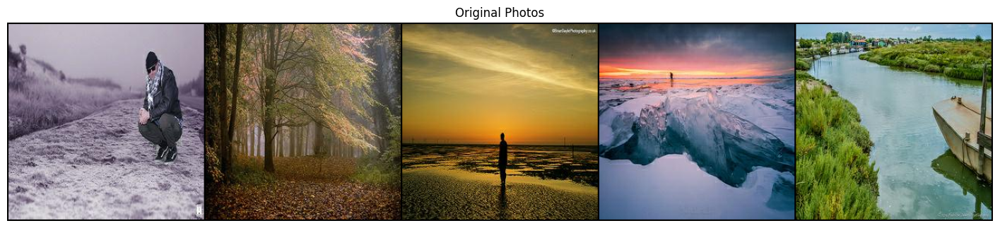

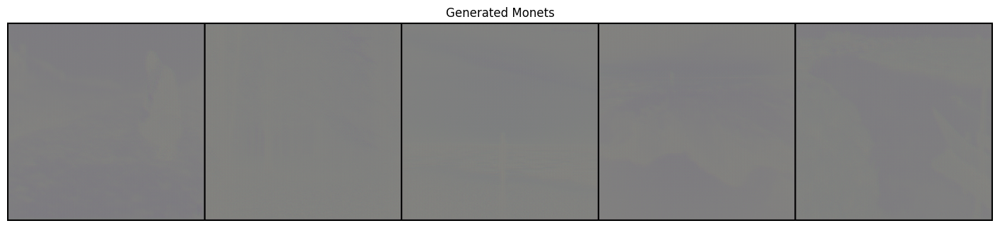

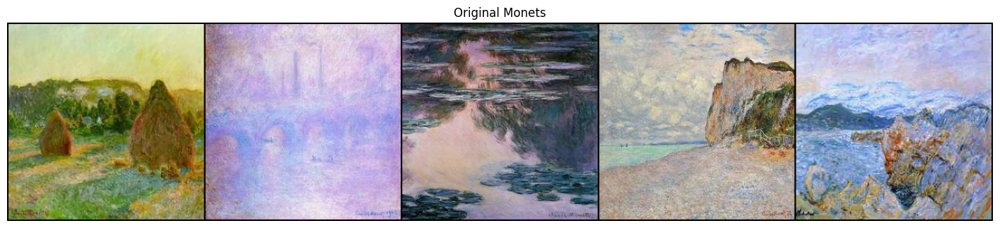

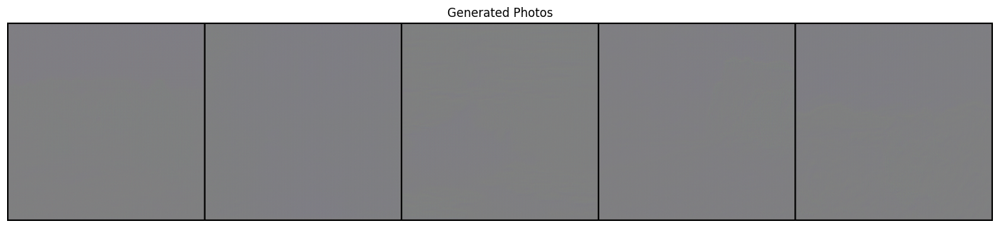

In [ ]:
# Base Dimensions to use
hid_channels = 64
in_channels = 3
out_channels = 3

# Generator to transform Photos to Monet Paintings
monet_generator = UNetGenerator(hid_channels, in_channels, out_channels)
# Generator to transform Monet Paintings to Photos
photo_generator = UNetGenerator(hid_channels, in_channels, out_channels)

# Give a batch of example photos to each generator
to_monet = monet_generator(example_photos)
to_photos = photo_generator(example_monets)

show_img(example_photos, nrow=5, title="Original Photos")
show_img(to_monet, nrow=5, title="Generated Monets")
show_img(example_monets, nrow=5, title="Original Monets")
show_img(to_photos, nrow=5, title="Generated Photos")

We can do the same with Discriminators, passing in photos to see the probability scores of the image being generated or from the Dataset. These have also not been trained yet and have meaninless results.

In [ ]:
# Discriminator to identify real photos
# Initial PatchGan architecture
photo_discriminator = Discriminator(hid_channels)


# TWO OBJECTIVE MONET DISCRIMINATOR
monet_discriminator = BodyDiscriminator(hid_channels)
monet_dhead1 = HeadDiscriminator(hid_channels)
monet_dhead2 = HeadDiscriminator(hid_channels)

# Give a real photo to each discriminator (first one photo shown above)
real_photo_scores = photo_discriminator(example_photos[0])

# Note we will get two results and sent to each head
intermediate = monet_discriminator(example_monets[0])
real_monet_scores1 = monet_dhead1(intermediate)
real_monet_scores2 = monet_dhead2(intermediate)

# Sizes are randomly initialized
print("Shapes")
print("Photo Discriminator Size")
print(real_photo_scores.shape)
print()
print("Monet Discriminator Size")
print("Intermediate")
print(intermediate.shape)
print("After Heads")
print(real_monet_scores1.shape)
print(real_monet_scores2.shape)
print()
print("Actual Scores")
print(real_photo_scores)
print(real_monet_scores1)
print(real_monet_scores2)

Shapes
Photo Discriminator Size
torch.Size([1, 30, 30])

Monet Discriminator Size
Intermediate
torch.Size([512, 31, 31])
After Heads
torch.Size([1, 30, 30])
torch.Size([1, 30, 30])

Actual Scores
tensor([[[-3.3314e-03, -6.3006e-03, -5.3293e-04, -6.8994e-03, -2.4132e-03,
          -6.6819e-03, -9.0334e-03, -8.1699e-03, -8.3647e-03, -8.3366e-03,
          -8.4804e-03, -8.2340e-03, -8.1959e-03, -7.9596e-03, -8.4625e-03,
          -9.1576e-03, -8.7998e-03, -9.1161e-03, -1.0230e-02, -6.3112e-03,
          -2.1789e-02, -5.9793e-03, -4.2635e-03, -4.3194e-03, -7.0369e-03,
          -1.0893e-02, -9.9152e-03, -5.1211e-03, -8.6876e-03, -5.3583e-03],
         [-1.2067e-02, -8.0920e-03,  3.3984e-03, -9.0058e-03, -1.0630e-02,
          -7.0445e-03, -4.6842e-03, -7.7177e-03, -8.4330e-03, -4.9877e-03,
          -4.5369e-03, -5.5401e-03, -5.2410e-03, -6.9697e-03, -6.1469e-03,
          -7.1099e-03, -5.6374e-03, -7.2635e-03, -9.3659e-03, -1.7781e-02,
          -2.5945e-02, -2.0168e-02, -1.8201e-02,  2.5

## Build THE CycleGAN!

We now have our Generator and Discriminators and are ready to build the CylcleGAN. First Let's explore the architecture and loss functions:



### Loss Functions

The training process consists of competing Generators and Discriminator with a variety of loss functions. With a new architecture, we will have two loss functions for each generator and discriminator corresponding to the two Heads: one for Hinge, and one for BCE. Cycle and Identity Loss remian the same as the baseline.

### Generator Loss

Our Generator Losses for in reference to the two discriminator Heads

In [ ]:
# Gen Loss 1 for Hinge
def generator_loss1(fake_discriminator_score):
    return torch.mean(-1 * fake_discriminator_score)

# Gen Loss 2 using BCE Loss
def generator_loss2(fake_discriminator_score):
    return torch.mean(torch.nn.BCEWithLogitsLoss()(torch.zeros_like(fake_discriminator_score), fake_discriminator_score))

2. **Adversarial Loss**: This loss evaluates how well a generator is tricking a discriminator. With a perfect generator, our fake generated image would produce a perfect discriminator score -> a matrix of all 1s. This loss function simply takes in the discriminator score of a fake image and compares it to a corresponding tensor of all 1s, evaluating how well we are currently tricking the discriminator

![image4.png](https://raw.githubusercontent.com/garrettdevereux/DeepLearningGenerativeArt/main/AdvLoss.png)

In [ ]:
# How good are we at tricking the discriminator
def get_adv_loss(fake_image_discriminator_score):
    # A perfect fake will have the discriminator produce all 1s
    real_labels = torch.ones_like(fake_image_discriminator_score)
    # Retrun mse between actual scores and 1s
    return F.mse_loss(fake_image_discriminator_score, real_labels)

2. **Cycle Loss**: This loss evaluates how similar our twice transformed images are. Part of the CycleGAN training process has us take a real photo from the dataset, use the first generator to produce a fake generated version of the image, and then feed this new fake photo back through the second generator to return back to the original domain. With perfect generators, this should be the same image as the original. This loss simply compares the L1 distance between the original image and the reconstructed image.

![image4.png](https://raw.githubusercontent.com/garrettdevereux/DeepLearningGenerativeArt/main/CycleLoss.png)

In [ ]:
# How similar are our twice transformed photos
# i.e real -> generated -> recon should have similar real and recon
def get_cycle_loss(real, recon, lambda_cycle):
    # Simply return reg * L1 loss between recon image and real image
    return lambda_cycle * F.l1_loss(recon, real)

3. **Identity Loss**: This loss evaluates how similar the original real image is compared with its identity image. Another part of the CycleGAN training step is passing a real image (such as a real monet paiting) into the monet generator whose goal is to produce monet paintings. As the input is already in the correct domain, a perfect generator would not change the image at all. This loss simply compares the L1 distance between the original real image and the generated identity image.

![image5.png](https://raw.githubusercontent.com/garrettdevereux/DeepLearningGenerativeArt/main/IdentityLoss.png)

In [ ]:
# How similar the real and identity images are
# Given a photo in the correct domain, our generator should do very little
def get_idt_loss(real, identity_image, lambda_idt):
    # Simply return reg * L1 loss between real and identity
    return lambda_idt * 0.5 * F.l1_loss(identity_image, real)

### Total Generator Loss
Finally, we put everything together to get the total loss of BOTH generators. This involves summing the total adversarial loss, cycle loss, and identity loss of both generators and discriminators:

![image6.png](https://raw.githubusercontent.com/garrettdevereux/DeepLearningGenerativeArt/main/GeneratorLoss.png)

In [47]:
# Computes the Loss of BOTH Generators, given
# - Original Photos from dataset, real_monet and real_photo
# - Generated Fakes, fake_monet and fake_photo
# - Reconstructed Photos, reconstructed_monet, reconstructed_photo
# - Identities, monet_identity and photo_identity
# - Discrim Scores of fake images, fake_monet_discrim_score, fake_photo_discrim_score
# - Model Hyperparams lambda_cycle and lambda_idt
def get_gen_loss(real_monet, real_photo, fake_monet, fake_photo, reconstructed_monet, reconstructed_photo,
                 monet_identity, photo_identity, monet_base_gen_loss, fake_photo_discrim_score, lambda_cycle, lambda_idt):
  

    # STEP 1: Compute Adversarial Loss using fakes and discriminator scores
    # Conceptually - how good the generatros are at tricking the discriminator
    # Adv Loss of monet generator
    adv_loss_photo_to_monet = monet_base_gen_loss
    # Adv Loss of photo generator
    adv_loss_monet_to_photo = get_adv_loss(fake_photo_discrim_score)
    total_adv_loss = adv_loss_photo_to_monet + adv_loss_monet_to_photo
            
    # STEP 2: Compute Cycle Loss using
    # Cycle loss of the original monet compared to reconstructed monet
    cycle_loss_MPM = get_cycle_loss(real_monet, reconstructed_monet, lambda_cycle[0])
    # Cycle loss of the original photo compared to reconstructed photo
    cycle_loss_PMP = get_cycle_loss(real_photo, reconstructed_photo, lambda_cycle[1])
    total_cycle_loss = cycle_loss_MPM + cycle_loss_PMP

    # STEP 3: Compute Identity Loss using reals and identities
    # Identity Loss of the real monet and monet identity
    idt_loss_MM = get_idt_loss(real_monet, monet_identity, lambda_idt)
    # Identity Loss of the real photo and identity photo
    idt_loss_PP = get_idt_loss(real_photo, photo_identity, lambda_idt)
    total_idt_loss = idt_loss_MM + idt_loss_PP
            
    # FINAL STEP: Sum losses to get total generator loss
    gen_loss = total_adv_loss + total_idt_loss + total_cycle_loss
    return gen_loss
     

### Discriminator Loss

Our Discriminator loss computes the loss of a single Discriminator. This is very similar to the Adversarial Loss, but now is evaluating how well the discriminator is performing on real and generated images. With a perfect Discriminator, our fake generated image would produce a discriminator score of all 0s, while a real image produces a discriminator score of all 1s. As we our now doing Dual Objective Discriminators, we have corresponding loss functions for both Hinge Loss and BCE.

![image7.png](https://raw.githubusercontent.com/garrettdevereux/DeepLearningGenerativeArt/main/DiscriminatorLoss.png)

In [48]:
# Hinge Discriminator Loss
def discriminator_loss1(real_discriminator_score, fake_discriminator_score):
    # Similar to Adversarial Loss, encourage discriminators to identify real and fakes
    real_loss = torch.minimum(torch.zeros_like(real_discriminator_score), real_discriminator_score -torch.ones_like(real_discriminator_score))
    generated_loss = torch.minimum(torch.zeros_like(fake_discriminator_score), -fake_discriminator_score-torch.ones_like(fake_discriminator_score))
    total_disc_loss = real_loss + generated_loss

    return torch.mean(-1 * total_disc_loss * 0.5)

# BCE Discriminator Loss
def discriminator_loss2(real_discriminator_score, fake_discriminator_score):
    generated_loss = torch.nn.BCEWithLogitsLoss()(torch.ones_like(fake_discriminator_score), fake_discriminator_score)
    real_loss = torch.nn.BCEWithLogitsLoss()(torch.zeros_like(real_discriminator_score), real_discriminator_score)
    total_disc_loss = real_loss + generated_loss

    return torch.mean(total_disc_loss * 0.5)

For Photo Discriminator

In [49]:
# Computes loss of Single Discriminator given fake and real discriminator scores
def get_disc_loss(real_discrim_score, fake_discrim_score):
    # STEP 1: Calculate real discrim loss
    # Our discriminator should output all 1s as this is a real image from the dataset
    real_labels = torch.ones_like(real_discrim_score)
    # Return mse between actual scores and 1s
    real_loss = F.mse_loss(real_discrim_score, real_labels)
        
    # STEP 2: Calculate fake discrim loss
    # Our discriminator should output all 0s as this is a generated image from the dataset
    fake_labels = torch.zeros_like(fake_discrim_score)
    # Return mse between actual scores and 1s
    fake_loss = F.mse_loss(fake_discrim_score, fake_labels)
        
    # Return average of losses
    disc_loss = (fake_loss + real_loss) * 0.5
    return disc_loss

### PyTorch Lightning Module
As we are using PyTorch Lightning, our CycleGAN will be a ```LightningModule```. This takes helps simplify the training process taking care of what device the code is run on while organizing our code into six parts:

*   Initialization (```__init__```).
*   Train Loop (```training_step()```)
*   Validation Loop (```validation_step()```)
*   Test Loop (```test_step()```)
*   Prediction Loop (```predict_step()```)
*   Optimizers and LR Schedulers (```configure_optimizers()```)

See the [PyTorch LightningModule Documentation](https://lightning.ai/docs/pytorch/stable/common/lightning_module.html) for more information. Also, note for the base model we are not using and LR Schedulers or decay, this can be added for more complexity later

In [50]:
class CycleGAN(L.LightningModule):
    def __init__(
        self,
        in_channels,
        out_channels,
        hid_channels,
        optimizer,
        lr,
        betas,
        lambda_idt,
        lambda_cycle,
        num_epochs,
        decay_epochs,
        monet_gen = None,
        photo_gen = None,
        monet_disc = None,
        photo_disc = None, 
        monet_disc_head1 = None,
        monet_disc_head2 = None
    ):
        super().__init__()
        self.save_hyperparameters(ignore=["optimizer"])
        self.optimizer = optimizer
        # Necessary to set as we are using multiple optimizers
        self.automatic_optimization = False

        # Step for Graphs
        self.step_num = 0
        
        # INITIALIZE OUR GENERATORS AND DISCRIMINATORS!!!!
        # Weights will automatically be initialized here

        # Generators:
        # Generator to transform Photos to Monet Paintings
        if monet_gen == None:
          self.monet_generator = UNetGenerator(hid_channels, in_channels, out_channels)
        else:
          self.monet_generator = monet_gen
  
        # Generator to transform Monet Paintings into Photos
        if photo_gen == None:
          self.photo_generator = UNetGenerator(hid_channels, in_channels, out_channels)
        else:
          self.photo_generator = photo_gen

        # Discriminators

        # Discriminator to identify real Photos
        if photo_disc == None:
          self.photo_discriminator = Discriminator(hid_channels)
        else:
          self.photo_discriminator = photo_disc

        # DUAL OBJECTIVE DISCRIMINATORS
        if monet_disc == None:
          self.monet_discriminator = BodyDiscriminator(hid_channels)
        else:
          self.monet_discriminator = monet_disc

        # HEADS FOR MONET DISCRIM

        if monet_disc_head1 == None:
          self.monet_disc_head1 = HeadDiscriminator(hid_channels)
        else:
          self.monet_disc_head1 = HeadDiscriminator(hid_channels)

        if monet_disc_head2 == None:
          self.monet_disc_head2 = HeadDiscriminator(hid_channels)
        else:
          self.monet_disc_head2 = HeadDiscriminator(hid_channels)

        # Metrics for Loss graphs
        self.losses = {
            "monet_gen_loss": [],
            "photo_gen_loss": [],
            "disc_loss_M": [],
            "disc_loss_P": [],
        }

    def get_lr_scheduler(self, optimizer):
      def lr_lambda(epoch):
          len_decay_phase = self.hparams.num_epochs - self.hparams.decay_epochs + 1.0
          curr_decay_step = max(0, epoch - self.hparams.decay_epochs + 1.0)
          val = 1.0 - curr_decay_step / len_decay_phase
          return max(0.0, val)
        
      return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_lambda)
        
    # As our predominant focus is creating the best Monet Painting Generator
    # Our forward simply passes in an image to the Monet Generator
    def forward(self, img):
        return self.monet_generator(img)   
    

    # Configure the Optimizers for both our generator and discriminator
    def configure_optimizers(self):
        # Load hyperparams
        opt_config = {
            "lr": self.hparams.lr,
            "betas": self.hparams.betas,
        }
        # Set up optimizer for generators
        opt_gen = self.optimizer(
            list(self.monet_generator.parameters()) + list(self.photo_generator.parameters()),
            **opt_config,
        )

        # Set up optimizer for discriminators
        opt_disc = self.optimizer(
            list(self.photo_discriminator.parameters()) + list(self.monet_discriminator.parameters()) + list(self.monet_disc_head1.parameters()) + list(self.monet_disc_head2.parameters()),
            **opt_config,
        )

        optimizers = [opt_gen, opt_disc]
        schedulers = [self.get_lr_scheduler(opt) for opt in optimizers]
        return optimizers, schedulers
    
    def training_step(self, batch, batch_idx):
        # Begin by storing batches of real monets and photos from the dataset
        real_monet = batch["monet"]
        real_photo = batch["photo"]

        batch_size = float(real_monet.shape[0])

        # Store the optimizers for the generators and discriminators
        gen_optimizer, disc_optimizer = self.optimizers()

        ## PHOTO CONSTRUCTION: fakes, reconstructions, and identities

        # STEP 1: Use Generators to produce fake images in both domains
        # Fake monet generated from the real photo
        fake_monet = self.monet_generator(real_photo)
        # Fake photo generated from the real monet
        fake_photo = self.photo_generator(real_monet)
         
        # STEP 2: Use generators and fakes to reconstruct original inputs
        # Reconstruction of original monet painting
        reconstructed_monet = self.monet_generator(fake_photo)
        # Reconstruction of original photo
        reconstructed_photo = self.photo_generator(fake_monet)

        # STEP 3: Construct identities by feeding real inputs into the generators
        # Monet identity: feed real monet into monet generator
        monet_identity = self.monet_generator(real_monet)
        # Photo identity: feed real photo into photo generator
        photo_identity = self.photo_generator(real_photo)


        ## DIFFERENTIAL AUGMENTATION!!!!!!
        
        # Pass a batch of real and fake to diff aug funciton
        aug_real_monet = aug_fn(real_monet)
        aug_fake_monet = aug_fn(fake_monet)

        ## DISCRIMINATOR SCORES
        # TWO OBJECTIVE DISCRIMINATOR!!!!!!!!!

        # STEP 4: Compute Discriminator Scores to see how well our
        # discriminators differentiate real and fake images
        # Scores of how good the fake generated monets are

        # HEAD 1 of MONET DISCRIMINATOR
        # Score of augmented fake from monet discriminator head 1
        fake_monet_discrim_score1 = self.monet_disc_head1(self.monet_discriminator(aug_fake_monet))
        # Score of augmented real from monet discriminator head 1
        real_monet_discrim_score1 = self.monet_disc_head1(self.monet_discriminator(aug_real_monet))

        # HEAD 2 of MONET DISCRIMINATOR
        # Score of augmented fake from monet discriminator head 2
        fake_monet_discrim_score2 = self.monet_disc_head1(self.monet_discriminator(aug_fake_monet))
        # Score of augmented real from monet discriminator head 2
        real_monet_discrim_score2 = self.monet_disc_head1(self.monet_discriminator(aug_real_monet))

        # PHOTO DISCRIMINATOR SCORES
        # Scores of how good the real photos are
        real_photo_discrim_score = self.photo_discriminator(real_photo)
        # Scores of how good the fake generated photos are
        fake_photo_discrim_score = self.photo_discriminator(fake_photo)


        ## COMPUTE LOSSES AND OPTIMIZE

        # Standard pipeline: Loss -> zero_grad -> backward -> step

        # GENERATOR LOSS
        self.toggle_optimizer(gen_optimizer)  

        # GENERATOR LOSS
        monet_base_gen_loss = 0.4 * (generator_loss1(fake_monet_discrim_score1) + generator_loss2(fake_monet_discrim_score2))

        total_generator_loss = get_gen_loss(real_monet, real_photo, fake_monet, fake_photo, reconstructed_monet, reconstructed_photo,
                 monet_identity, photo_identity, monet_base_gen_loss, fake_photo_discrim_score, self.hparams.lambda_cycle, self.hparams.lambda_idt)
        
        # Complete Pipeline
        gen_optimizer.zero_grad()
        self.manual_backward(total_generator_loss)
        gen_optimizer.step()
        self.untoggle_optimizer(gen_optimizer)

        
        # DISCRIMINATOR LOSS
        self.toggle_optimizer(disc_optimizer)

        # MONET DISCRIMINATOR LOSS
        monet_head_loss1 = discriminator_loss1(real_monet_discrim_score1, fake_monet_discrim_score1.detach())
        monet_head_loss2 = discriminator_loss2(real_monet_discrim_score2, fake_monet_discrim_score2.detach())
        monet_disc_loss = monet_head_loss1 + monet_head_loss2

        # PHOTO DISCRIMINATOR LOSS
        photo_disc_loss = get_disc_loss(real_photo_discrim_score, self.photo_discriminator(fake_photo.detach()))

        # Complete Pipeline
        disc_optimizer.zero_grad()
        self.manual_backward(monet_disc_loss)
        self.manual_backward(photo_disc_loss)
        disc_optimizer.step()
        self.untoggle_optimizer(disc_optimizer)

        
        # Done with training step
        # Log metrics and losses
        metrics = {
            "gen_loss": total_generator_loss,
            "disc_loss_M": monet_disc_loss,
            "disc_loss_P": photo_disc_loss,
        }
        self.log_dict(metrics, on_step=False, on_epoch=True, prog_bar=True)

        # Add to Losses for graphs
        self.losses["monet_gen_loss"].append(float(total_generator_loss))
        self.losses["disc_loss_M"].append(float(monet_disc_loss))
        self.losses["disc_loss_P"].append(float(photo_disc_loss))
        
        
    # Output current progress of generator on a validation set
    def validation_step(self, batch, batch_idx):
        self.display_results(batch, batch_idx, "validate")
    
    # Output current progress of generator on a test set
    def test_step(self, batch, batch_idx):
        self.display_results(batch, batch_idx, "test")
        
    # Predict the results of a batch
    def predict_step(self, batch, batch_idx):
        return self(batch)
    
    # Function to Visualize Results
    def display_results(self, batch, batch_idx, stage):
        # Store batch of real input photos and corresponding fake generated monets
        real_photos = batch
        fake_monets = self(real_photos)
        
        if stage == "validate":
            title = f"Epoch {self.current_epoch+1}: Photo-to-Monet Translation"
        else:
            title = f"Sample {batch_idx+1}: Photo-to-Monet Translation"

        # Display current image results
        show_img(
            torch.cat([real_photos, fake_monets], dim=0),
            nrow=len(real_photos),
            title=title,
        )
    
    def on_train_epoch_start(self):
        # Update Progress Bar
        curr_lr = self.lr_schedulers()[0].get_last_lr()[0]
        self.log("lr", curr_lr , on_step=False, on_epoch=True, prog_bar=True)
        
    def on_train_epoch_end(self):
        for sch in self.lr_schedulers():
          sch.step()
        # Print Current State of Models
        logged_values = self.trainer.progress_bar_metrics
        print(
            f"Epoch {self.current_epoch+1}",
            *[f"{k}: {v:.5f}" for k, v in logged_values.items()],
            sep=" - ",
        )
        
    def on_train_end(self):
        print("Saving Final Models.")
        # Save Models into Checkpoints
        monet_gen_path = checkpoints + "/monet_generator" + str(self.current_epoch) + ".pth"
        torch.save(self.monet_generator.state_dict(), monet_gen_path)

        photo_gen_path = checkpoints + "/photo_generator" + str(self.current_epoch) + ".pth"
        torch.save(self.photo_generator.state_dict(), photo_gen_path)

        monet_disc_path = checkpoints + "/monet_discriminator" + str(self.current_epoch ) + ".pth"
        torch.save(self.monet_discriminator.state_dict(), monet_disc_path)

        photo_disc_path = checkpoints + "/photo_discriminator" + str(self.current_epoch) + ".pth"
        torch.save(self.photo_discriminator.state_dict(), photo_disc_path)

        dhead1_path = checkpoints + "/dhead1_discriminator" + str(self.current_epoch) + ".pth"
        torch.save(self.monet_disc_head1.state_dict(), dhead1_path)

        dhead2_path = checkpoints + "/dhead2_discriminator" + str(self.current_epoch) + ".pth"
        torch.save(self.monet_disc_head2.state_dict(), dhead2_path)
        print("Training ended.")
        
    def on_predict_epoch_end(self, results):
        predictions = self.trainer.predict_loop.predictions
        print(f"Done predicting")

## Training Configuration

We use PyTorch Lightning Training Object to do everything for us! Here we set up the requuired Configuration and Params.

In [51]:
DM_CONFIG = {    
    # Directories of the Monet Paintings and Photos
    "monet_dir": os.path.join("./Dataset/gan-getting-started/monet_jpg", "*.jpg"),
    "photo_dir": os.path.join("./Dataset/gan-getting-started/photo_jpg", "*.jpg"),
    
    "loader_config": {
        # the number of subprocesses (excluding the main process) used for data loading
        "num_workers": os.cpu_count(),
        
        # enable faster data transfer to GPU during training
        "pin_memory": torch.cuda.is_available(),
    },
    
    # the validation/test batch size (mainly for visualization purposes)
    "sample_size": 5,
    
    # the training/prediction batch size
    "batch_size": 8
}

In [56]:
MODEL_PARAMS = {    
    # In channels and out channels
    "in_channels": 3,
    "out_channels": 3,

    # the number of filters in the first layer for the generators and discriminators
    "hid_channels": 64,
    
    # using Adam
    "optimizer": ds.ops.adam.FusedAdam if torch.cuda.is_available() else torch.optim.Adam,
    
    # the learning rate and beta parameters for the Adam optimizer
    "lr": 2e-4,
    "betas": (0.5, 0.999),
    
    # the weights used in the identity loss and cycle loss
    "lambda_idt": 0.5,
    "lambda_cycle": (10, 10), # (MPM direction, PMP direction)
    
    # the number of epochs for training
    "num_epochs": 1,

    "decay_epochs": 10,
}

In [54]:
TRAIN_CONFIG = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    
    # train on 16-bit precision
    "precision": 16,
    
    # train on single GPU
    "devices": 1,
    
    # We are manually checkpointing inside fo the GAN
    "enable_checkpointing": False,
    
    # disable logging for simplicity
    "logger": False,
    
    # the number of epochs for training (we limit the number of train/predict batches during debugging)
    "max_epochs": MODEL_PARAMS["num_epochs"],
    "limit_train_batches": 1.0,
    "limit_predict_batches": 1.0,
    
    # the maximum amount of time for training, in case we exceed run-time of 5 hours
    "max_time": {"hours": 11, "minutes": 55},
    
    # use a small subset of photos for validation/testing (we limit here for flexibility)
    "limit_val_batches": 1,
    "limit_test_batches": 5,
        
    # disable sanity check before starting the training routine
    "num_sanity_val_steps": 0,
    
    # the frequency to visualize the progress of adding Monet style
    "check_val_every_n_epoch": 1,
}

## TRAIN THE CYLCEGAN
We have now defined all required elements in order to train our model. We now use PyTorch Lightning to do the training, instantiating a ```CustomDataModule``` object to handle the Dataset, our ```CylceGAN``` to store the model parameters and controlling all of the steps, and a PyTorch ```Trainer``` object that handles the entire training process. Calling ```trainer.fit``` with the model and datamodule will then train the model.

In [57]:
# Initialize Trainer with model
dm = CustomDataModule(**DM_CONFIG)
model = CycleGAN(**MODEL_PARAMS)
trainer = L.Trainer(**TRAIN_CONFIG)

trainer.fit(model, datamodule=dm)

INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
INFO:pytorch_lightning.utilities.rank_zero:`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
INFO:pytorch_lightning.utilities.rank_zero:`Trainer(limit_predict_batches=1.0)` was configured so 100% of the batches will be used..
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Using /root/.cache/torch_extensions/py310_cu118 as PyTorch extensions root...
No modifications detected for re-loaded 

Time to load fused_adam op: 0.0012111663818359375 seconds
Time to load fused_adam op: 0.0014743804931640625 seconds


Training: 0it [00:00, ?it/s]

## Post Training Visualization

Let's visualize how the Loss of both of the Generators as well as the individual Discriminator Losses changed throughout the training process.

KeyError: ignored

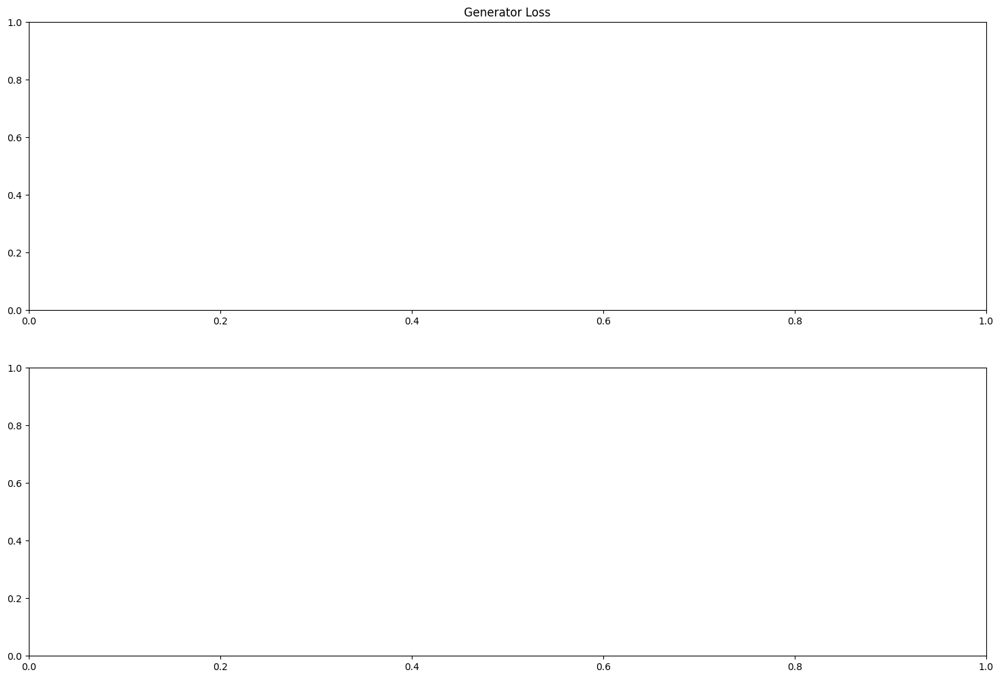

In [58]:
# Loss Plots
fig, axes = plt.subplots(ncols=1, nrows=2, figsize=(18, 12), facecolor='w')
training_steps = np.arange(len(model.losses["monet_gen_loss"]))

# Plot the Generator Loss
axes[0].set_title("Generator Loss")
axes[0].plot(training_steps, model.losses["gen_loss"], label='Monet Generator Loss')
axes[0].legend()
axes[0].set_xlabel('Steps')

# Plot the Discriminator Losses
axes[1].set_title("Discriminator Losses")
axes[1].plot(training_steps, model.losses["disc_loss_M"], label='Monet Discriminator Loss')
axes[1].plot(training_steps, model.losses["disc_loss_P"], label='Photo Discriminator Loss')
axes[1].legend()
axes[1].set_xlabel('Steps')

plt.show()

### Load Saved Models
We will next Load our previously trained models so this section can be run without having to train models for hours. This will allow us to repeat the visualization process of the Generators and Discriminators AFTER training

In [ ]:
# Base Dimensions to use
hid_channels = 64
in_channels = 3
out_channels = 3

# Load Generator to transform Photos to Monet Paintings
monet_generator = UNetGenerator(hid_channels, in_channels, out_channels)
monet_gen_path = checkpoints + "/LoadModels/monet_generator8.pth"
monet_generator.load_state_dict(torch.load(monet_gen_path))

# Load Generator to transform Photos to Monet Paintings
photo_generator = UNetGenerator(hid_channels, in_channels, out_channels)
photo_generator_path = checkpoints + "/LoadModels/photo_generator8.pth"
photo_generator.load_state_dict(torch.load(photo_generator_path))

# Load Discriminator to identify real Monet Paintings
monet_discriminator = BodyDiscriminator(hid_channels)
monet_discriminator_path = checkpoints + "/LoadModels/monet_discriminator8.pth"
monet_discriminator.load_state_dict(torch.load(monet_discriminator_path))

# Load Discriminator to identify real Photos
photo_discriminator = Discriminator(hid_channels)
photo_discriminator_path = checkpoints + "/LoadModels/photo_discriminator8.pth"
photo_discriminator.load_state_dict(torch.load(photo_discriminator_path))

# Load Discriminator to 
dhead1_discriminator = HeadDiscriminator(hid_channels)
dhead1_discriminator_path = checkpoints + "/LoadModels/dhead1_discriminator8.pth"
dhead1_discriminator.load_state_dict(torch.load(dhead1_discriminator_path))

# Load Discriminator to 
dhead2_discriminator = HeadDiscriminator(hid_channels)
dhead2_discriminator_path = checkpoints + "/LoadModels/dhead2_discriminator8.pth"
dhead2_discriminator.load_state_dict(torch.load(dhead2_discriminator_path))


<All keys matched successfully>

## Visualizing Trained Generators and Discriminators
Let's now feed batches of images of photos and monet paintings to our generators to see how they perform. On top of generated fakes, let's also generate the cyclic and identity photos. Here we also print out Discriminator Results. Analysis of results

Visualizing Results produced from Original Photos


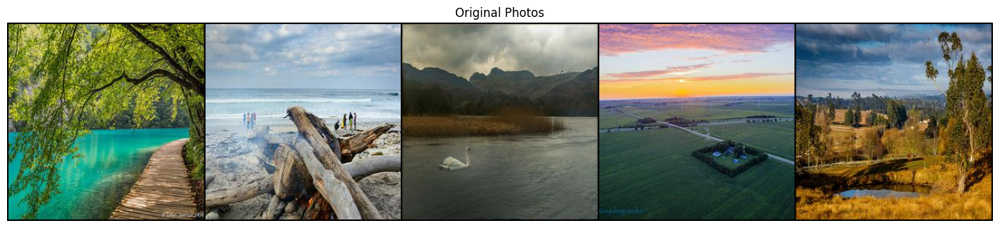

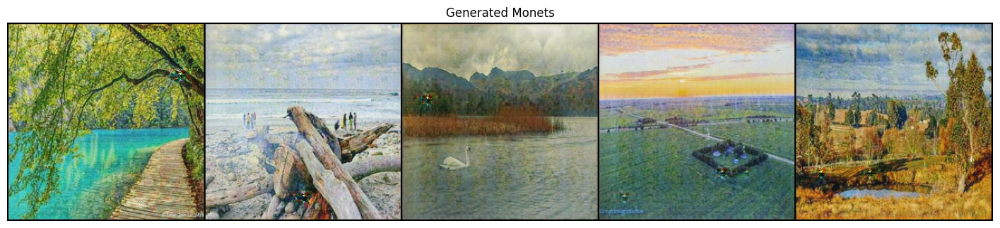

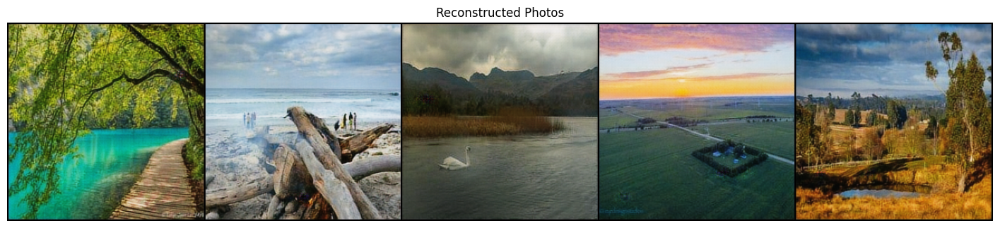

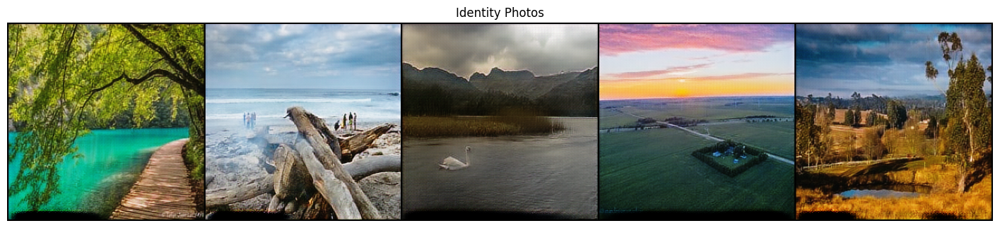

Visualizing Results produced from Original Monets


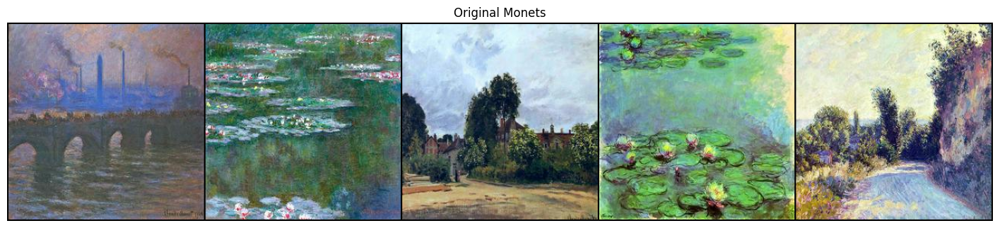

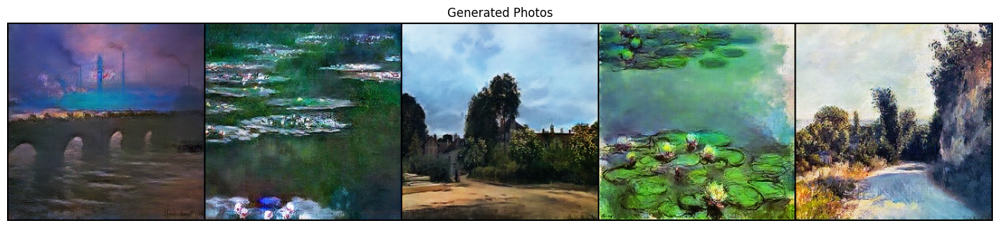

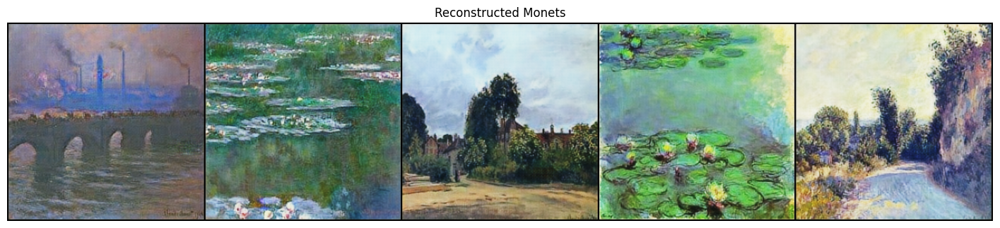

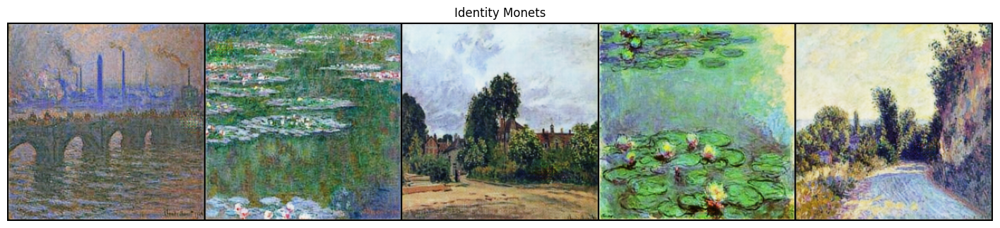

In [ ]:
# Contruct Fakes, Reconstructions, and Identities 
# with a batch of example photos and money paintings
fake_monets = monet_generator(example_photos)
fake_photos = photo_generator(example_monets)

recon_monet = monet_generator(fake_photos)
recon_photo = photo_generator(fake_monets)

idt_monet = monet_generator(example_monets)
idt_photo = photo_generator(example_photos)

# Discriminator Scores

real_monet_score1 = dhead1_discriminator(monet_discriminator(example_monets[0]))
real_monet_score2 = dhead2_discriminator(monet_discriminator(example_monets[0]))
real_photo_score = photo_discriminator(example_photos[0])
fake_monet_score = dhead1_discriminator(monet_discriminator(fake_monets[0]))
fake_photo_score = photo_discriminator(fake_photos[0])
ones_label = torch.ones_like(real_photo_score)
zeros_label = torch.zeros_like(real_photo_score)

print("Visualizing Results produced from Original Photos")
# Visualize from Original Photos
show_img(example_photos, nrow=5, title="Original Photos")
show_img(fake_monets, nrow=5, title="Generated Monets")
show_img(recon_photo, nrow=5, title="Reconstructed Photos")
show_img(idt_photo, nrow=5, title="Identity Photos")

# Visualize from Original Monets
print("Visualizing Results produced from Original Monets")
show_img(example_monets, nrow=5, title="Original Monets")
show_img(fake_photos, nrow=5, title="Generated Photos")
show_img(recon_monet, nrow=5, title="Reconstructed Monets")
show_img(idt_monet, nrow=5, title="Identity Monets")

print("Discrim Scores")
print(real_monet_score1)
print(real_monet_score2)
print(real_photo_score)

## Submit To Kaggle

Finally, we can submit our final model to Kaggle!